The following resources are what I primarily used for this notebook. 

[Description of the MFCC Methodology](https://link.springer.com/content/pdf/bbm:978-3-319-49220-9/1.pdf)

[Descpription of applying the z-tranform in code](https://www.youtube.com/watch?v=nkq4WkX7CFU&t=1014s)

In this notebook, I will be exploring how to implement a basic pre-emphasis transfer function to a set of samples. For MFCC feature extraction, the most commonly used pre-emphasis filter is given by the following transfer function

$$
H(z) = 1 - bz^{-1}
$$
$$
b = [0.4, 1.0]
$$
The variable *b* controls the slope of the filter and is typically between 0.4 and 1.0. 

The inverse z-transform can be described as a linear equation of unit timesteps. Thus for the equation above, we would have the following equation in the time domain

$$
y(t) = x(t) - bx(t - 1)
$$

where y(t) is our sample after we've applied the z-transform and x(t) is a sample. 


In [4]:
# imports 
from scipy import signal
import numpy as np
import math
import matplotlib.pyplot as plt
import control.matlab
from scipy.io import wavfile
from IPython.display import Audio
import os
from tqdm import tqdm
import build.pybind_modules.dsp_module as cu
import build.pybind_modules.matrix_module as myMatrix


Below I am going to discretize the following Laplace Transform
$$
\frac{Y(s)}{U(s)} = H(s) = \frac{s + 2}{s^2 + s + 2}
$$

The transfer function, H(s)

   s + 2
-----------
s^2 + s + 2

The transfer function H(z) at Ts = 0.01

0.005025 z^2 + 9.95e-05 z - 0.004925
------------------------------------
       z^2 - 1.99 z + 0.9901

dt = 0.01

The transfer function H(z) at Ts = 1

0.5 z^2 + 0.5 z + 2.776e-17
---------------------------
     z^2 - 0.5 z + 0.5

dt = 1



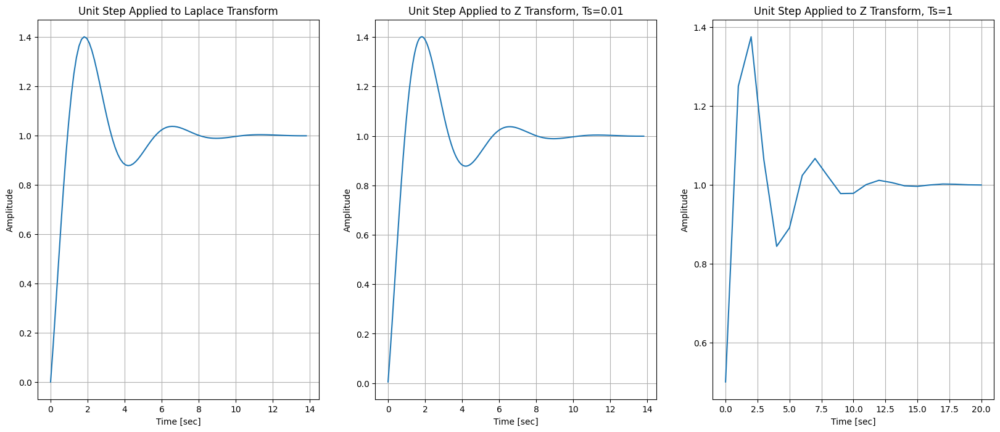

In [5]:
num = [1, 2] # numerators in transfer function
den = [1, 1, 2] # denominators in transfer function

Ts_1 = 0.01
Ts_2 = 1

lti = control.matlab.tf(num, den) # creating the transfer function
z_transform = control.matlab.c2d(lti, Ts_1, method='tustin', prewarp_frequency=None)
z_transform_2 = control.matlab.c2d(lti, Ts_2, method='tustin', prewarp_frequency=None)

print("The transfer function, H(s)")
print(lti)
print("The transfer function H(z) at Ts = {}".format(Ts_1))
print(z_transform)
print("The transfer function H(z) at Ts = {}".format(Ts_2))
print(z_transform_2)

y, tout = control.matlab.step(lti)
y_2, tout_2 = control.matlab.step(z_transform)
y_3, tout_3 = control.matlab.step(z_transform_2)

plt.figure(figsize=(20, 8))
plt.subplot(131)
plt.plot(tout, y)
plt.title("Unit Step Applied to Laplace Transform")
plt.ylabel("Amplitude")
plt.xlabel("Time [sec]")
plt.grid(True)
plt.subplot(132)
plt.plot(tout_2, y_2)
plt.title("Unit Step Applied to Z Transform, Ts={}".format(Ts_1))
plt.ylabel("Amplitude")
plt.xlabel("Time [sec]")
plt.grid(True)
plt.subplot(133)
plt.plot(tout_3, y_3)
plt.title("Unit Step Applied to Z Transform, Ts={}".format(Ts_2))
plt.ylabel("Amplitude")
plt.xlabel("Time [sec]")
plt.grid(True)

As you can see above, as the period between samples becomes greater, the z-transform becomes less accurate to its continous counter part. In the scope of this project, the period between samples will correspond with the sampling rate of each wav file. Since the sampling rate of each wav file should generally be 44.1 kHz, the period between each sample should be relatively short, thus the z-transform should be a good approximate of the Laplace transform for these discretized samples. I chose to be lazy and use the Matlab Step function to apply the unit step to the z-transforms. In practice, the unit step would be discretized at a sampling rate corresponding to Ts, and the equation for the z-transform with a Ts of 0.01 seconds to implement in the time domain would be 
$$
y(t) = 0.005*u(t) + 9.95e-5*u(t-1) - 0.005*u(t-2) + 1.99*y(t-1) - 0.9901*y(t-2)
$$

Where $y(t-2)$ and $y(t-1)$ would need initial conditions. Below is a function implementing that implements the pre-emphasis filter in the time domain.

In [6]:
def pre_emphasis_filter(data, b = 0.4):
    prev_sample = 0
    output = np.zeros(len(data))

    for i in range(len(data)):
        output[i] = data[i] - b*prev_sample
        prev_sample = data[i]

    return output
        

In [7]:
wav_path = "music_samples_wav/chicago.wav"
# use Scipy's wav file reader
fs, scipy_samples = wavfile.read(wav_path)

Audio(scipy_samples, rate=fs)

/home/jchavez/.local/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1369: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


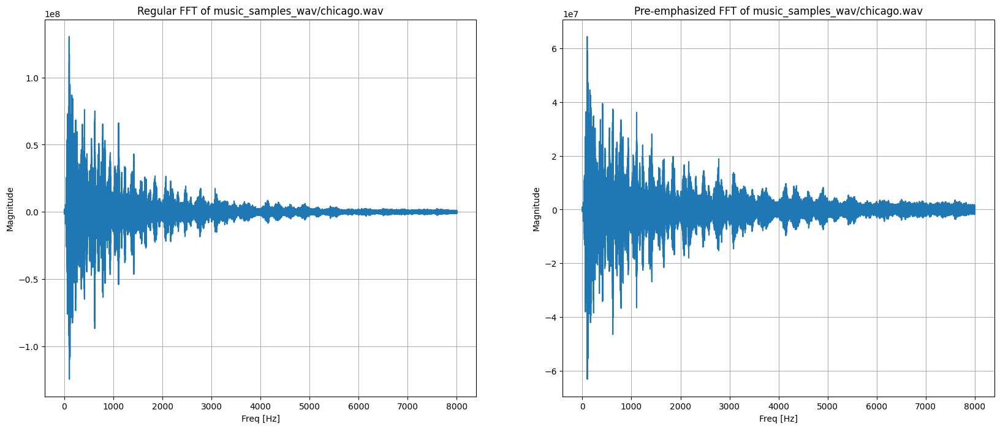

In [8]:
fft_results = np.fft.rfft(scipy_samples)
pre_samples = pre_emphasis_filter(scipy_samples, b = 0.5)
pre_fft_results = np.fft.rfft(pre_samples)

f = np.linspace(0, fs/2, len(fft_results))

plt.figure(figsize=(20,8))
plt.subplot(121)
plt.plot(f, fft_results)
plt.title("Regular FFT of {}".format(wav_path))
plt.ylabel("Magnitude")
plt.xlabel("Freq [Hz]")
plt.grid(True)
plt.subplot(122)
plt.plot(f, pre_fft_results)
plt.title("Pre-emphasized FFT of {}".format(wav_path))
plt.ylabel("Magnitude")
plt.xlabel("Freq [Hz]")
plt.grid(True)

The next steps involve slicing the samples into frames, applying a window (typically the Hanning window), taking the Short Time Fourier Transform (stft), and finally calculating the power spectrum. I go over this process in more detail in the *stft_introduction.ipynb* note book, thus this next section will continue from creating Mel filter banks. 

The following [link](https://haythamfayek.com/2016/04/21/speech-processing-for-machine-learning.html) helped me figure out how to develop Mel filter banks in Python. In order to convert between Hz(f) and mel (m), we use the following equations. 
$$
m = 2595log_{10}(1+\frac{f}{700})
$$
$$
f = 700*(10^{\frac{m}{2595}} - 1)
$$

We then want to choose a range of Mel frequencies which should be from 0 to half the sampling rate of the audio. We typically want around 40 Mel filter banks. 

In [32]:
sample_rate = 44100
NFFT = 1024 # fft size 
nfilt = 40 # number of mel filters

low_freq_mel = 0
high_freq_mel = (2595 * np.log10(1 + (sample_rate / 2) / 700))  # Convert Hz to Mel
mel_points = np.linspace(low_freq_mel, high_freq_mel, nfilt + 2)  # Equally spaced in Mel scale
hz_points = (700 * (10**(mel_points / 2595) - 1))  # Convert Mel to Hz
bin = np.floor((NFFT + 1) * hz_points / sample_rate)

fbank = np.zeros((nfilt, int(np.floor(NFFT / 2 + 1))))
for m in range(1, nfilt + 1):
    f_m_minus = int(bin[m - 1])   # left
    f_m = int(bin[m])             # center
    f_m_plus = int(bin[m + 1])    # right

    for k in range(f_m_minus, f_m):
        fbank[m - 1, k] = (k - bin[m - 1]) / (bin[m] - bin[m - 1])
    for k in range(f_m, f_m_plus):
        fbank[m - 1, k] = (bin[m + 1] - k) / (bin[m + 1] - bin[m])

print(fbank.shape)

(40, 513)


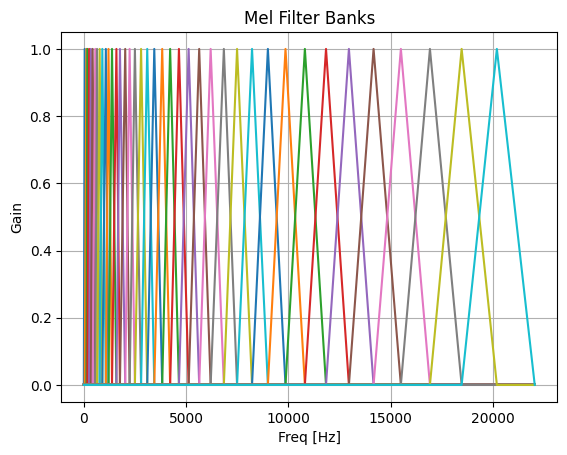

In [37]:
freq_axis = np.linspace(0,sample_rate/2, 513)
plt.figure()
for i in range(fbank.shape[0]):    
    plt.plot(freq_axis,fbank[i,:])
plt.xlabel("Freq [Hz]")
plt.ylabel("Gain")
plt.title("Mel Filter Banks")
plt.grid(True)

After obtaining the Mel filters, you can apply them in the frequency domain directly to the transformed signal to create s(m). 

$$
s(m) = \sum_{k=1}^{N-1} \left|X(k)^2\right| H_{m}(k), 0 \le m \le M - 1
$$

The final step is conductin the discrete cosine transform (DCT) with the following equation. 

$$
c(n) = \sum_{m=0}^{M-1} \log_{10}(s(m))\cos(\frac{\pi n(m-0.5)}{M}), n = 0,1,2,...,C-1
$$

Traditional MFCC systems use 8 to 13 cepstral coefficients. The zeroth coefficient is often excluded. 

In [10]:
def get_signal_Hz(Hz,sample_rate,length_ts_sec):
    ## 1 sec length time series with sampling rate 
    ts1sec = list(np.linspace(0,np.pi*2*Hz,sample_rate))
    ## 1 sec length time series with sampling rate 
    # multiplying a list by a constant appends constant copies to the list itself
    ts = ts1sec*length_ts_sec
    return(list(np.sin(ts)))

In [11]:
def compute_mfcc(spectrum, nfilt, num_ceps, sample_rate, NFFT):
    # compute filter banks
    low_freq_mel = 0
    high_freq_mel = (2595 * np.log10(1 + (sample_rate / 2) / 700))  # Convert Hz to Mel
    mel_points = np.linspace(low_freq_mel, high_freq_mel, nfilt + 2)  # Equally spaced in Mel scale
    hz_points = (700 * (10**(mel_points / 2595) - 1))  # Convert Mel to Hz
    bin = np.floor((NFFT + 1) * hz_points / sample_rate)

    fbank = np.zeros((nfilt, int(np.floor(NFFT / 2 + 1))))
    for m in range(1, nfilt + 1):
        f_m_minus = int(bin[m - 1])   # left
        f_m = int(bin[m])             # center
        f_m_plus = int(bin[m + 1])    # right

        for k in range(f_m_minus, f_m):
            fbank[m - 1, k] = (k - bin[m - 1]) / (bin[m] - bin[m - 1])
        for k in range(f_m, f_m_plus):
            fbank[m - 1, k] = (bin[m + 1] - k) / (bin[m + 1] - bin[m])

    # create s(m) here from result
    # rows of s represent signal after applied to filter bank, and columns are time frames
    s = np.zeros((nfilt, spectrum.shape[1]))

    # iterate through each s(m) for all time frames
    for i in range(nfilt):
        for j in range(spectrum.shape[0]):
            s[i,:] += spectrum[j,:]*fbank[i,j]

    ceps = np.zeros((num_ceps, spectrum.shape[1]))

    # iterate and calculate cepstral coefficients
    for n in range(num_ceps):
        for m in range(s.shape[0]):
            ceps[n,:] += np.log10(s[m,:])*np.cos(((np.pi * n * (m - 0.5))/num_ceps))
    # ceps = np.where(ceps <= 0, np.finfo(float).eps, ceps)
    # ceps = np.log10(ceps)

    return ceps, s

def compute_full_mfcc(samples, nfilt, num_ceps, sample_rate, NFFT, noverlap=-1):
    # compute filter banks
    spectrum = np.array(myMatrix.DSP_Matrix(list(samples), sample_rate, NFFT, noverlap, True, 2, True), copy=False)
    # spectrum = cu.cuSTFT(list(samples), sample_rate, NFFT, noverlap, True, 2, True)
    spectrum = np.where(spectrum == 0, np.finfo(float).eps, spectrum)
    low_freq_mel = 0
    high_freq_mel = (2595 * np.log10(1 + (sample_rate / 2) / 700))  # Convert Hz to Mel
    mel_points = np.linspace(low_freq_mel, high_freq_mel, nfilt + 2)  # Equally spaced in Mel scale
    hz_points = (700 * (10**(mel_points / 2595) - 1))  # Convert Mel to Hz
    bin = np.floor((NFFT + 1) * hz_points / sample_rate)

    fbank = np.zeros((nfilt, int(np.floor(NFFT / 2 + 1))))
    for m in range(1, nfilt + 1):
        f_m_minus = int(bin[m - 1])   # left
        f_m = int(bin[m])             # center
        f_m_plus = int(bin[m + 1])    # right

        for k in range(f_m_minus, f_m):
            fbank[m - 1, k] = (2*(k - bin[m - 1])) / (bin[m] - bin[m - 1])
        for k in range(f_m, f_m_plus):
            fbank[m - 1, k] = (2*(bin[m + 1] - k)) / (bin[m + 1] - bin[m])

    # create s(m) here from result
    # rows of s represent signal after applied to filter bank, and columns are time frames
    s = np.zeros((nfilt, spectrum.shape[1]))

    # iterate through each s(m) for all time frames
    for i in range(nfilt):
        for j in range(spectrum.shape[0]):
            s[i,:] += spectrum[j,:]*fbank[i,j]

    ceps = np.zeros((num_ceps, spectrum.shape[1]))

    # iterate and calculate cepstral coefficients
    for n in range(num_ceps):
        for m in range(s.shape[0]):
            ceps[n,:] += np.log10(s[m,:])*np.cos(((np.pi * n * (m - 0.5))/num_ceps))
    # ceps = np.where(ceps <= 0, np.finfo(float).eps, ceps)
    # ceps = np.log10(ceps)

    return ceps


ceps: [[-26.47920478  -4.14965793 -26.36861978 ...  -4.06572944 -25.96899054
   -9.15569054]
 [-15.55270449  -1.30687618 -14.75562456 ...  -0.87859618 -12.81588747
   -4.72516072]
 [  0.36170531   3.03640269   1.50976812 ...   1.59109263  -6.24046397
   -0.32720102]
 ...
 [ -2.70182572   1.147852    -2.55767392 ...   0.12123649  -1.18728256
   -0.72236661]
 [  2.43062817   0.75745476   2.60392731 ...   0.65404435  -1.45417713
    0.36647528]
 [ -2.29517115   0.57672514  -2.2481793  ...   0.96098004   0.76929772
    0.67896824]]
shape ceps: (12, 2496), shape result_hanning: (513, 2496)
ceps total: 29952, result_hanning total: 1280448


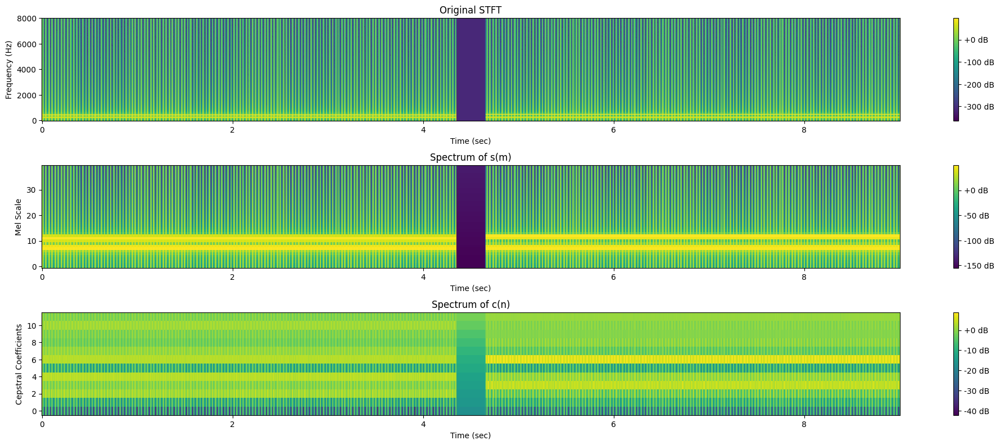

In [12]:
# sample_rate   = 4000
length_ts_sec = 14
## --------------------------------- ##
## 3 seconds of "digit 1" sound
## Pressing digit 2 buttom generates 
## the sine waves at frequency 
## 697Hz and 1209Hz.
## --------------------------------- ##
ts1  = np.array(get_signal_Hz(697, sample_rate,length_ts_sec)) 
ts1 += np.array(get_signal_Hz(1209,sample_rate,length_ts_sec))
ts1  = list(ts1)

## -------------------- ##
## 2 seconds of silence
## -------------------- ##
ts_silence = [0]*sample_rate*1

## --------------------------------- ##
## 3 seconds of "digit 2" sounds 
## Pressing digit 2 buttom generates 
## the sine waves at frequency 
## 697Hz and 1336Hz.
## --------------------------------- ##
ts2  = np.array(get_signal_Hz(697, sample_rate,length_ts_sec)) 
ts2 += np.array(get_signal_Hz(1336,sample_rate,length_ts_sec))
ts2  = list(ts2)

## -------------------- ##
## Add up to 7 seconds
## ------------------- ##
# concatenates the lists, doesn't sum their values like a numpy array
ts = ts1 + ts_silence  + ts2

nfft = NFFT 
noverlap = -1
result_hanning = cu.cuSTFT(list(ts), sample_rate, nfft, noverlap, True, 2, True)
result_hanning = np.where(result_hanning == 0, np.finfo(float).eps, result_hanning)

nfilt = 40
num_ceps = 13
ceps, s = compute_mfcc(result_hanning, nfilt, num_ceps, sample_rate, nfft)
ceps = ceps[1:,:]
num_ceps -= 1
s = 10.0 * np.log10(s)

print("ceps: {}".format(ceps))
print("shape ceps: {}, shape result_hanning: {}".format(ceps.shape, result_hanning.shape))
print("ceps total: {}, result_hanning total: {}".format(ceps.shape[0]*ceps.shape[1], result_hanning.shape[0]*result_hanning.shape[1]))


t = np.linspace(0, 9, result_hanning.shape[1])
n = np.arange(num_ceps)
s_n = np.arange(nfilt)
f = np.linspace(0, fs/2, result_hanning.shape[0])
result_hanning = 20 * np.log10(result_hanning)
fig = plt.figure(figsize=(20,8))

plt.subplot(311)
plt.title("Original STFT")
plt.xlabel("Time (sec)")
plt.ylabel("Frequency (Hz)")
plt.pcolormesh(t, f, result_hanning)
plt.colorbar(format="%+2.f dB")

plt.subplot(312)
plt.title("Spectrum of s(m)")
plt.ylabel("Mel Scale")
plt.xlabel("Time (sec)")
plt.pcolormesh(t, s_n, s)
plt.colorbar(format="%+2.f dB")

plt.subplot(313)
plt.title("Spectrum of c(n)")
plt.ylabel("Cepstral Coefficients")
plt.xlabel("Time (sec)")
plt.pcolormesh(t, n, ceps)
plt.colorbar(format="%+2.f dB")

fig.tight_layout(pad=1.0)
plt.show()


shape ceps: (12, 1291), shape result_hanning: (513, 1291)
ceps total: 15492, result_hanning total: 662283


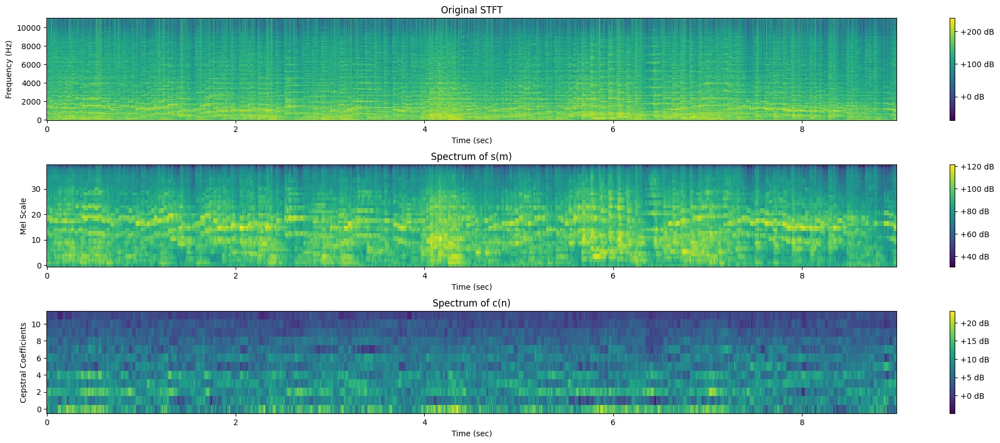

In [13]:
# now do mfcc on a classical song

fs, samples = wavfile.read("GTZAN/classical/classical.00000.wav")

nfft = NFFT 
noverlap = -1
result_hanning = cu.cuSTFT(list(samples), sample_rate, nfft, noverlap, True, 2, True)
result_hanning = np.where(result_hanning == 0, np.finfo(float).eps, result_hanning)

nfilt = 40
num_ceps = 13
ceps, s = compute_mfcc(result_hanning, nfilt, num_ceps, sample_rate, nfft)
ceps = compute_full_mfcc(samples, nfilt, num_ceps, fs, nfft, noverlap)
ceps = ceps[1:,:]
num_ceps -= 1
s = 10.0 * np.log10(s)

# print("ceps: {}".format(ceps))
print("shape ceps: {}, shape result_hanning: {}".format(ceps.shape, result_hanning.shape))
print("ceps total: {}, result_hanning total: {}".format(ceps.shape[0]*ceps.shape[1], result_hanning.shape[0]*result_hanning.shape[1]))


t = np.linspace(0, 9, result_hanning.shape[1])
n = np.arange(num_ceps)
s_n = np.arange(nfilt)
f = np.linspace(0, fs/2, result_hanning.shape[0])
result_hanning = 20 * np.log10(result_hanning)
fig = plt.figure(figsize=(20,8))

plt.subplot(311)
plt.title("Original STFT")
plt.xlabel("Time (sec)")
plt.ylabel("Frequency (Hz)")
plt.pcolormesh(t, f, result_hanning)
plt.colorbar(format="%+2.f dB")

plt.subplot(312)
plt.title("Spectrum of s(m)")
plt.ylabel("Mel Scale")
plt.xlabel("Time (sec)")
plt.pcolormesh(t, s_n, s)
plt.colorbar(format="%+2.f dB")

plt.subplot(313)
plt.title("Spectrum of c(n)")
plt.ylabel("Cepstral Coefficients")
plt.xlabel("Time (sec)")
plt.pcolormesh(t, n, ceps)
plt.colorbar(format="%+2.f dB")

fig.tight_layout(pad=1.0)
plt.show()

ceps: [[16.27803389 15.28569754 17.71243183 ... 23.95913407 21.31486317
  17.99968931]
 [10.84636566  7.28933452  7.25418586 ... 13.76980093 12.49777744
  12.73620149]
 [ 8.79447107  7.41398001  7.07726705 ... 12.85105397 10.39754698
  10.48633998]
 ...
 [ 4.43505643  2.00563784  3.29394634 ...  4.6414708   4.01350102
   4.29634709]
 [ 3.36458144  3.0063782   3.33939064 ...  3.14791067  3.32315145
   2.06970944]
 [ 0.26106854  0.24256573  1.16774617 ...  1.69801746 -0.1321804
   0.62874654]]
shape ceps: (12, 1291), shape result_hanning: (513, 1291)
ceps total: 15492, result_hanning total: 662283


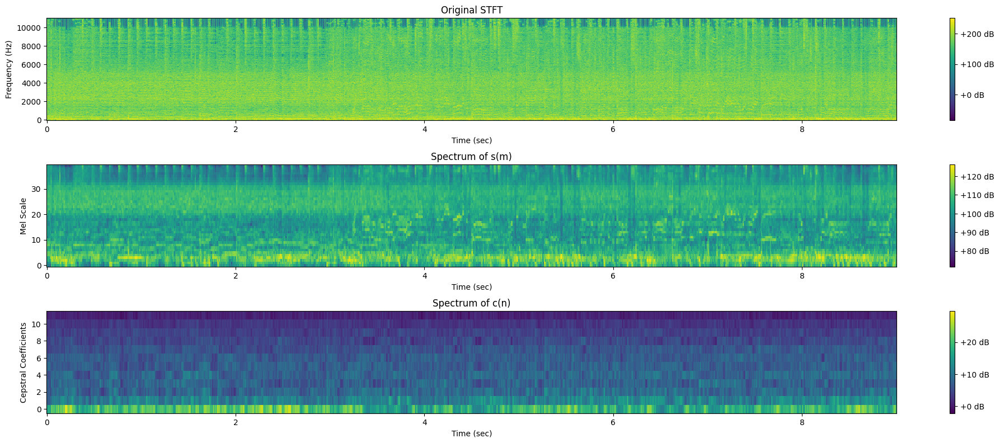

In [14]:
# now do mfcc on a meta song

fs, samples = wavfile.read("GTZAN/metal/metal.00000.wav")

nfft = NFFT 
noverlap = -1
result_hanning = cu.cuSTFT(list(samples), sample_rate, nfft, noverlap, True, 2, True)
result_hanning = np.where(result_hanning == 0, np.finfo(float).eps, result_hanning)

nfilt = 40
num_ceps = 13
ceps, s = compute_mfcc(result_hanning, nfilt, num_ceps, sample_rate, nfft)
ceps = ceps[1:,:]
num_ceps -= 1
s = 10.0 * np.log10(s)

print("ceps: {}".format(ceps))
print("shape ceps: {}, shape result_hanning: {}".format(ceps.shape, result_hanning.shape))
print("ceps total: {}, result_hanning total: {}".format(ceps.shape[0]*ceps.shape[1], result_hanning.shape[0]*result_hanning.shape[1]))


t = np.linspace(0, 9, result_hanning.shape[1])
n = np.arange(num_ceps)
s_n = np.arange(nfilt)
f = np.linspace(0, fs/2, result_hanning.shape[0])
result_hanning = 20 * np.log10(result_hanning)
fig = plt.figure(figsize=(20,8))

plt.subplot(311)
plt.title("Original STFT")
plt.xlabel("Time (sec)")
plt.ylabel("Frequency (Hz)")
plt.pcolormesh(t, f, result_hanning)
plt.colorbar(format="%+2.f dB")

plt.subplot(312)
plt.title("Spectrum of s(m)")
plt.ylabel("Mel Scale")
plt.xlabel("Time (sec)")
plt.pcolormesh(t, s_n, s)
plt.colorbar(format="%+2.f dB")

plt.subplot(313)
plt.title("Spectrum of c(n)")
plt.ylabel("Cepstral Coefficients")
plt.xlabel("Time (sec)")
plt.pcolormesh(t, n, ceps)
plt.colorbar(format="%+2.f dB")

fig.tight_layout(pad=1.0)
plt.show()

ceps: [[24.20348753 19.04877267 24.61422247 ...  6.33588231  9.35057007
  10.35193037]
 [14.80000957 14.82336275 20.25229883 ...  6.25860846  6.37317303
   8.06556445]
 [10.1743264  10.81854104 13.04248514 ...  5.19225634  9.44133569
   8.68506582]
 ...
 [ 5.33577691  4.2207723   5.29464805 ...  3.06089795  3.40228576
   3.64367113]
 [ 2.83810758  3.48596464  5.10490014 ...  3.6194054   2.86729858
   3.26941777]
 [ 1.94644013  1.8626316   1.42725633 ...  0.37356454  1.41022658
   0.22475449]]
shape ceps: (12, 1291), shape result_hanning: (513, 1291)
ceps total: 15492, result_hanning total: 662283


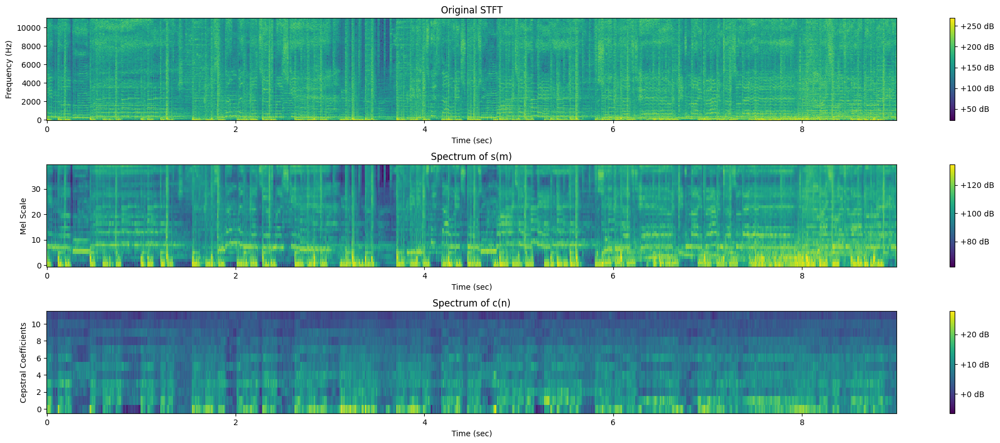

In [15]:
# now do mfcc on a pop song

fs, samples = wavfile.read("GTZAN/pop/pop.00000.wav")

nfft = NFFT 
noverlap = -1
result_hanning = cu.cuSTFT(list(samples), sample_rate, nfft, noverlap, True, 2, True)
# result_hanning = np.where(result_hanning == 0, np.finfo(float).eps, result_hanning)

nfilt = 40
num_ceps = 13
ceps, s = compute_mfcc(result_hanning, nfilt, num_ceps, sample_rate, nfft)
ceps = ceps[1:,:]
num_ceps -= 1
s = 10.0 * np.log10(s)

print("ceps: {}".format(ceps))
print("shape ceps: {}, shape result_hanning: {}".format(ceps.shape, result_hanning.shape))
print("ceps total: {}, result_hanning total: {}".format(ceps.shape[0]*ceps.shape[1], result_hanning.shape[0]*result_hanning.shape[1]))


t = np.linspace(0, 9, result_hanning.shape[1])
n = np.arange(num_ceps)
s_n = np.arange(nfilt)
f = np.linspace(0, fs/2, result_hanning.shape[0])
result_hanning = 20 * np.log10(result_hanning)
fig = plt.figure(figsize=(20,8))

plt.subplot(311)
plt.title("Original STFT")
plt.xlabel("Time (sec)")
plt.ylabel("Frequency (Hz)")
plt.pcolormesh(t, f, result_hanning)
plt.colorbar(format="%+2.f dB")

plt.subplot(312)
plt.title("Spectrum of s(m)")
plt.ylabel("Mel Scale")
plt.xlabel("Time (sec)")
plt.pcolormesh(t, s_n, s)
plt.colorbar(format="%+2.f dB")

plt.subplot(313)
plt.title("Spectrum of c(n)")
plt.ylabel("Cepstral Coefficients")
plt.xlabel("Time (sec)")
plt.pcolormesh(t, n, ceps)
plt.colorbar(format="%+2.f dB")

fig.tight_layout(pad=1.0)
plt.show()

ceps: [[12.07930054  8.37285897  7.68373297 ...  1.85916029 -3.34461034
   1.1496962 ]
 [ 6.6867234   5.88067622  5.93050993 ...  5.07428784  3.7675736
   5.51150138]
 [ 5.67524452  5.75791293  6.04578322 ...  7.49844888  5.19872638
   7.53435994]
 ...
 [ 5.484606    2.67303306  4.06472168 ...  3.79468801  4.25316754
   5.32076987]
 [-0.2769488   1.36064798  0.33546794 ...  0.68285205  0.30837314
   2.0731811 ]
 [-0.36731505  0.7441386   1.05219722 ...  0.8475289   1.08785631
   1.43569422]]
shape ceps: (12, 1296), shape result_hanning: (513, 1296)
ceps total: 15552, result_hanning total: 664848


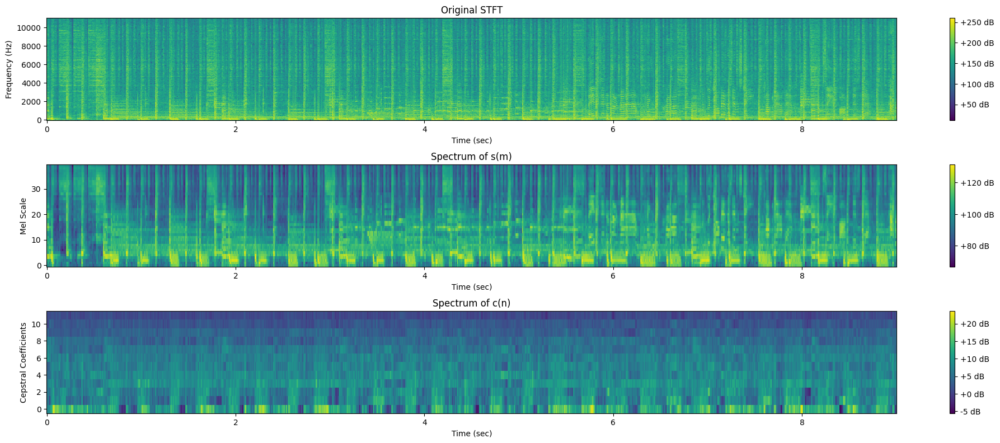

In [16]:
# now do mfcc on a pop song

fs, samples = wavfile.read("GTZAN/disco/disco.00000.wav")

nfft = NFFT 
noverlap = -1
result_hanning = cu.cuSTFT(list(samples), sample_rate, nfft, noverlap, True, 2, True)
result_hanning = np.where(result_hanning == 0, np.finfo(float).eps, result_hanning)

nfilt = 40
num_ceps = 13
ceps, s = compute_mfcc(result_hanning, nfilt, num_ceps, sample_rate, nfft)
ceps = ceps[1:,:]
num_ceps -= 1
s = 10.0 * np.log10(s)

print("ceps: {}".format(ceps))
print("shape ceps: {}, shape result_hanning: {}".format(ceps.shape, result_hanning.shape))
print("ceps total: {}, result_hanning total: {}".format(ceps.shape[0]*ceps.shape[1], result_hanning.shape[0]*result_hanning.shape[1]))


t = np.linspace(0, 9, result_hanning.shape[1])
n = np.arange(num_ceps)
s_n = np.arange(nfilt)
f = np.linspace(0, fs/2, result_hanning.shape[0])
result_hanning = 20 * np.log10(result_hanning)
fig = plt.figure(figsize=(20,8))

plt.subplot(311)
plt.title("Original STFT")
plt.xlabel("Time (sec)")
plt.ylabel("Frequency (Hz)")
plt.pcolormesh(t, f, result_hanning)
plt.colorbar(format="%+2.f dB")

plt.subplot(312)
plt.title("Spectrum of s(m)")
plt.ylabel("Mel Scale")
plt.xlabel("Time (sec)")
plt.pcolormesh(t, s_n, s)
plt.colorbar(format="%+2.f dB")

plt.subplot(313)
plt.title("Spectrum of c(n)")
plt.ylabel("Cepstral Coefficients")
plt.xlabel("Time (sec)")
plt.pcolormesh(t, n, ceps)
plt.colorbar(format="%+2.f dB")

fig.tight_layout(pad=1.0)
plt.show()

After using MFCC to extract features, we can try plugging them into a neural network. I will use PyTorch to create my neural network. 

In [17]:
import torch
import torch.nn as nn
# import torch.nn.functional as F
import torch.optim as optim
# from utils import get_dataset_from_arrays
from torch.utils.data import DataLoader

In [18]:
# Check if GPU is available
torch.cuda.is_available()

True

In [19]:
def compute_accuracies(predicted_labels, dev_set, dev_labels):
    yhats = predicted_labels
    # np.int was deprecated in latest versions
    # assert predicted_labels.dtype == np.int, "Your predicted labels have type {}, but they should have type np.int (consider using .astype(int) on your output)".format(predicted_labels.dtype)
    assert predicted_labels.dtype == int, "Your predicted labels have type {}, but they should have type np.int (consider using .astype(int) on your output)".format(predicted_labels.dtype)

    if len(yhats) != len(dev_labels):
        print("Lengths of predicted labels don't match length of actual labels", len(yhats), len(dev_labels))
        return 0., 0., 0., 0.
    accuracy = np.mean(yhats == dev_labels)
    conf_m = np.zeros((len(np.unique(dev_labels)),len(np.unique(dev_labels))))
    for i,j in zip(dev_labels,predicted_labels):
        conf_m[i,j] +=1

    return accuracy, conf_m

def get_parameter_counts(net):
    """ Get the parameters of your network
    @return params: a list of tensors containing all parameters of the network
            num_params: count of the total number of parameters
    """
    params = net.parameters()
    num_parameters = sum([ np.prod(w.shape) for w  in params])

    return num_parameters,params

class MyDataset(torch.utils.data.Dataset):
    def __init__(self, X,y):
        """
        Args:
            X [np.array]: features vector
            y [np.array]: labels vector          
        """
        self.data = X
        self.labels = y

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        features = self.data[idx,:]
        label = self.labels[idx]
        sample = {'features': features,'labels': label}
        return sample

class NeuralNet(nn.Module):
    def __init__(self, lrate, loss_fn, in_size, out_size):
        """
        Initializes the layers of your neural network.

        @param lrate: learning rate for the model
        @param loss_fn: A loss function defined as follows:
            @param yhat - an (N,out_size) Tensor
            @param y - an (N,) Tensor
            @return l(x,y) an () Tensor that is the mean loss
        @param in_size: input dimension
        @param out_size: output dimension

        For Part 1 the network should have the following architecture (in terms of hidden units):

        in_size -> h ->  out_size , where  1 <= h <= 256
        
        We recommend setting lrate to 0.01 for part 1.

        """
        super(NeuralNet, self).__init__()
        # define layers for music classification 
        # self.l1 = nn.Linear(in_features=in_size, out_features=in_size//2, bias=True) # , dtype=torch.float64)
        # self.l2 = nn.Linear(in_features=in_size//2, out_features=in_size//4, bias=True) #,dtype=torch.float64)
        # self.l3 = nn.Linear(in_features=in_size//4, out_features=in_size//8, bias=False) #, dtype=torch.float64)
        # self.l4 = nn.Linear(in_features=in_size//8, out_features=in_size//256, bias=False) #, dtype=torch.float64)
        # self.l5 = nn.Linear(in_features=in_size//256, out_features=out_size, bias=False) #, dtype=torch.float64)

        self.l1 = nn.Linear(in_features=in_size, out_features=256, bias=True) # , dtype=torch.float64)
        self.l2 = nn.Linear(in_features=256, out_features=128, bias=True) #,dtype=torch.float64)
        self.l3 = nn.Linear(in_features=128, out_features=out_size, bias=False) #, dtype=torch.float64)


        self.loss_fn = loss_fn
        self.double()
        # self.long()
        # kernel_size = (3,3)
        # self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=kernel_size, stride=1, padding=1)
        # self.maxpool = nn.MaxPool2d(kernel_size=kernel_size, stride=1, padding=1)
        # self.conv2 = nn.Conv2d(in_channels=16, out_channels=3, kernel_size=kernel_size, stride=1, padding=1)

        # self.model = nn.Sequential(self.conv1, nn.ReLU6(), self.maxpool, self.conv2, nn.ReLU6(), self.maxpool)

        # self.linear = nn.Linear(in_features=in_size, out_features=out_size)
        self.optimizer = optim.SGD(self.parameters(), lr=lrate, weight_decay=1e-5)

    def conv_out_size(self, inp_size, kernel_size, dilation, padding, stride):
        return ((inp_size + 2*padding - dilation * (kernel_size - 1) - 1) // stride) + 1
    

    def forward(self, x):
        """Performs a forward pass through your neural net (evaluates f(x)).

        @param x: an (N, in_size) Tensor
        @return y: an (N, out_size) Tensor of output from the network
        """
        # print("x has type: {} with dtype: {}:".format(type(x), x.dtype))

        # x = nn.functional.relu(self.l1(x)) # pass x through linear layer, then apply relu activation
        # x = nn.functional.relu(self.l2(x)) # do it again for the next layer
        # x = nn.functional.relu(self.l3(x)) # do it again for the next layer
        # x = nn.functional.relu(self.l4(x)) # do it again for the next layer
        # x = self.l5(x) # last layer no activation

        x = nn.functional.relu(self.l1(x)) # pass x through linear layer, then apply relu activation
        x = nn.functional.relu(self.l2(x)) # do it again for the next layer
        x = self.l3(x) # last layer no activation

        return x # or torch.sigmoid(x) or softmax(x) if we want probabilities

        x = x.view(x.shape[0], 3, 31, 31)
        # x = self.linear(self.model(x).view(x.shape[0], 3*31*31))
        x = self.model(x)
        x = x.view(x.shape[0], 3*31*31)
        return self.linear(x)
        return torch.ones(x.shape[0], 1)

    def step(self, x,y):
        """
        Performs one gradient step through a batch of data x with labels y.

        @param x: an (N, in_size) Tensor
        @param y: an (N,) Tensor
        @return L: total empirical risk (mean of losses) for this batch as a float (scalar)
        """
        # raise NotImplementedError("You need to write this part!")

        # zero out the optimizer
        self.optimizer.zero_grad()

        # pass the batch through the model
        y_hat = self.forward(x)
        # compute the lost
        # loss = self.loss_fn(y_hat.double(), y.double())
        loss = self.loss_fn(y_hat, y)

        # update model
        loss.backward()
        self.optimizer.step()

        return loss.item()
        # return loss.detach().cpu().numpy()



def fit(train_set,train_labels,dev_set,epochs,batch_size=100):
    """ Make NeuralNet object 'net' and use net.step() to train a neural net
    and net(x) to evaluate the neural net.

    @param train_set: an (N, in_size) Tensor
    @param train_labels: an (N,) Tensor
    @param dev_set: an (M,) Tensor
    @param epochs: an int, the number of epochs of training
    @param batch_size: size of each batch to train on. (default 100)

    This method _must_ work for arbitrary M and N.

    The model's performance could be sensitive to the choice of learning rate.
    We recommend trying different values in case your first choice does not seem to work well.

    @return losses: list of floats containing the total loss at the beginning and after each epoch.
            Ensure that len(losses) == epochs.
    @return yhats: an (M,) NumPy array of binary labels for dev_set
    @return net: a NeuralNet object
    """
    # raise NotImplementedError("You need to write this part!")
    # print(len(train_labels))
    # print(train_set)
    # print(train_labels)
    # print(dev_set)
    
    # u = train_set.mean()
    # a = train_set.std()

    # norm_set = (train_set-u)/a
    # norm_dev = (dev_set-u)/a
    # data = MyDataset(norm_set, train_labels)
    data = MyDataset(train_set, train_labels)
    data = DataLoader(data, batch_size=batch_size, shuffle=True, drop_last=False)
    # nn.CrossEntropyLoss(),
    # print("train_set shape 1: {}".format(train_set.shape[1]))
    # NetObject = NeuralNet(0.01, nn.MSELoss(), train_set.shape[1], 10)
    NetObject = NeuralNet(0.01, nn.CrossEntropyLoss(), train_set.shape[1], 10)

    losses = []
    for epoch in range(epochs):
        print("\rEpoch {}".format(epoch), end="")
        epoch_loss = 0.0
        for batch in data:
            batch_x, batch_y = batch
            # print(batch[batch_x])
            # print(batch[batch_x].shape)
            # print(batch[batch_y])
            # print(batch[batch_y].shape)
            epoch_loss += NetObject.step(batch[batch_x], batch[batch_y])
        epoch_loss /= len(data)

        losses.append(epoch_loss)

    with torch.no_grad():
        # ytemp = NetObject.forward(norm_dev).detach().numpy()
        ytemp = NetObject.forward(dev_set).detach().numpy()
        
    # print(ytemp)
    
    predicted_labels = []
    for i in range(len(ytemp)):
        idx = np.argmax(ytemp[i]).astype(int)
        predicted_labels.append(idx)

    predicted_labels = np.array(predicted_labels)
        
    return losses,predicted_labels,NetObject

In [20]:
# now we would like to gather the data and train our neural network
# this will be down by grabbing 90 songs from each of the 10 categories and using them to trian the neural network
# then the 10 unchosen songs from each category will be the test data sets

curr_dir = os.getcwd() + '/GTZAN'
dir_list = os.listdir(curr_dir) 
dir_list = [label for label in dir_list if '.' not in label] # only files have . in them, directories should not
print(curr_dir) # prints the current directory

# gather the directores that house all the songs
for i in range(len(dir_list)):
    print("Label {}: {}".format(i, dir_list[i]))
genres = dir_list
dir_list = [curr_dir + '/' + genre + '/' for genre in dir_list]

# general mfcc and stft parameters
noverlap = -1
nfft = 1024
nfilt = 40
num_ceps = 13

# lists to house processed data
processed_genres = []
train_labels = []
dev_data = []
dev_set_labels = []

# iterate through each genre directory
for i, _ in enumerate(tqdm(dir_list)):
    # gather the file paths to each track
    track_list = os.listdir(dir_list[i])
    track_list = [dir_list[i] + track for track in track_list]
    # array to hold the raw data of every song in a genre
    raw_data = []
    # attempt to read each song
    for song in track_list:
        try:
            raw_data.append(wavfile.read(song))
        except:
            print("can't read {}".format(song))

    # compute the mfcc in each song and append as a complete list in the processed_genres list
    processed_genres.append([compute_full_mfcc(samples, nfilt, num_ceps, sample_rate, nfft, noverlap)[1:].ravel() for sample_rate, samples in raw_data[:90]])
    # append labels that correspond to the songs we just processed for the training set
    train_labels += [i for n in range(90)]
    # get the number of remaining songs that aren't in the training set
    len_dev_set = len(raw_data[90:])
    # compute the mfcc for the songs that will be added to the dev set
    dev_data.append([compute_full_mfcc(samples, nfilt, num_ceps, sample_rate, nfft, noverlap)[1:].ravel() for sample_rate, samples in raw_data[90:90+len_dev_set]])
    # append labels that correspond to the songs we just processed for the dev set
    dev_set_labels += [i for n in range(len_dev_set)]

/home/jchavez/Documents/PersonalProjects/MusicClassification/GTZAN
Label 0: hiphop
Label 1: classical
Label 2: blues
Label 3: metal
Label 4: jazz
Label 5: country
Label 6: pop
Label 7: rock
Label 8: disco
Label 9: reggae


 40%|████      | 4/10 [01:05<01:38, 16.35s/it]

can't read /home/jchavez/Documents/PersonalProjects/MusicClassification/GTZAN/jazz/jazz.00054.wav


100%|██████████| 10/10 [02:48<00:00, 16.89s/it]


In [21]:
train_set_entries = 0
dev_set_len = 0
min_mfcc_len = -1 # because the amount of data in songs are slightly different, truncate to the smallest size

for i in range(len(processed_genres)):
    # acquire the data lengths for each song in a genre 
    mfcc_lengths = [processed_genres[i][j].shape[0] for j in range(len(processed_genres[i]))]
    # get the smallest data length
    curr_mfcc_min_len = np.min(mfcc_lengths)
    # update the overall smallest data length in the entire training set
    if min_mfcc_len == -1 or curr_mfcc_min_len < min_mfcc_len:
        min_mfcc_len = curr_mfcc_min_len
    # update the number of entries in the training set
    train_set_entries += len(processed_genres[i])


for i in range(len(dev_data)):
    # acquire the data lengths for each song in a genre 
    mfcc_lengths = [dev_data[i][j].shape[0] for j in range(len(dev_data[i]))]
    # get the smallest data length
    curr_mfcc_min_len = np.min(mfcc_lengths)
    # update the overall smallest data length in the entire training set
    if min_mfcc_len == -1 or curr_mfcc_min_len < min_mfcc_len:
        min_mfcc_len = curr_mfcc_min_len
    # update the number of entries in the dev set
    dev_set_len += len(dev_data[i])

# now fill training_set in format that neural network wants it in
train_set = np.zeros((train_set_entries, min_mfcc_len))
train_labels = np.array(train_labels) # labels are correct, just need to make it a numpy array

train_set_idx = 0 # current index into the train_set
size_mismatches = 0 # last check if there is issues with data sizes
for i in range(len(processed_genres)):
    curr_genre = processed_genres[i] # array holding the songs for the current genre
    # for every song, place it into the train_set array
    for j in range(len(curr_genre)):
        try:
            train_set[train_set_idx] = curr_genre[j][:min_mfcc_len]
            train_set_idx += 1
        except:
            print("i: {}, j: {}".format(i,j))
            print("size of data: {}".format(curr_genre[j].shape))
            size_mismatches += 1

print("Mismatches: {}".format(size_mismatches))


# now fill dev_set in format that neural network wants it in 
dev_set = np.zeros((dev_set_len, min_mfcc_len))
dev_set_labels = np.array(dev_set_labels) # labels are correct, just need to make it a numpy array
dev_set_idx = 0 # current index into the dev_set
for i in range(len(dev_data)):
    curr_dev_data = dev_data[i] # hold the songs for the current genre
    # for every song in the genre, add it to the dev_set array
    for j in range(len(curr_dev_data)):
        dev_set[dev_set_idx] = curr_dev_data[j][:min_mfcc_len]
        dev_set_idx += 1

print(len(train_labels))
print(len(dev_set_labels))
print("type dev set: {}, dtype: {}".format(type(dev_set), dev_set.dtype))
print("type train set: {}, dtype: {}".format(type(train_set), train_set.dtype))
print("min_mfcc_len: {}".format(min_mfcc_len))


Mismatches: 0
900
99
type dev set: <class 'numpy.ndarray'>, dtype: float64
type train set: <class 'numpy.ndarray'>, dtype: float64
min_mfcc_len: 15456


In [22]:
batch_size = 10
epochs = 50

# convert numpys to torches
train_set = torch.tensor(train_set, dtype=torch.float64)
train_labels = torch.tensor(train_labels, dtype=torch.int64)
dev_set = torch.tensor(dev_set, dtype=torch.float64)
# dev_set_labels = torch.tensor(dev_set_labels)

# fit data
L, predicted_labels, net = fit(train_set,train_labels,dev_set,epochs,batch_size)

assert type(predicted_labels) == np.ndarray, "your fit function returned the predicted labels as {} instead of np.ndarray. Make sure to use .detach().cpu().numpy() on the network output - and don't forget to argmax it!".format(type(predicted_labels))
assert type(L) == list,"your fit function returned the losses as {} instead of list. Make sure you are returning a list of losses (with length equal to the number of epochs)".format(type(L))

accuracy, conf_m = compute_accuracies(predicted_labels, dev_set, dev_set_labels)

print("\n Accuracy:", accuracy)
print("\nConfusion Matrix = \n {}".format(conf_m))
num_parameters,params = get_parameter_counts(net)
print('\nparameters = {} \n'.format(num_parameters))


Epoch 49
 Accuracy: 0.10101010101010101

Confusion Matrix = 
 [[ 0.  0.  0.  0.  0.  0.  0.  0. 10.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0. 10.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0. 10.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0. 10.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  9.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0. 10.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0. 10.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0. 10.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0. 10.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0. 10.  0.]]

parameters = 3991168 



In [23]:
start = 20
end = start + 20
print(predicted_labels[start:end])
print(dev_set_labels[start:end])

[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8]
[2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3]


In [24]:
# potential way to speed up memory copying from above
a = np.array([0, 1, 1, 2, 3, 4])
b = np.where(a != 1)
print(b[0])

[0 3 4 5]


In [25]:
#import libraries
import numpy as np
import pandas as pd
import scipy.io.wavfile as wav
from python_speech_features import mfcc
from tempfile import TemporaryFile
import os
import math
import pickle
import random
import operator

In [26]:
def distance(instance1, instance2, k):
    distance = 0
    mm1 = instance1[0]
    cm1 = instance1[1]
    mm2 = instance2[0]
    cm2 = instance2[1]
    distance = np.trace(np.dot(np.linalg.inv(cm2), cm1))
    distance += (np.dot(np.dot((mm2-mm1).transpose(), np.linalg.inv(cm2)), mm2-mm1))
    distance += np.log(np.linalg.det(cm2)) - np.log(np.linalg.det(cm1))
    distance -= k
    return distance

In [27]:
#define a function to get distance between feature vectors and find neighbors
def getNeighbors(trainingset, instance, k):
    distances = []
    for x in range(len(trainingset)):
        dist = distance(trainingset[x], instance, k) + distance(instance,trainingset[x],k)
        distances.append((trainingset[x][2], dist))
    distances.sort(key=operator.itemgetter(1))
    neighbors = []
    for x in range(k):
        neighbors.append(distances[x][0])
    return neighbors

In [28]:
#function to identify the nearest neighbors
def nearestclass(neighbors):
    classVote = {}
    
    for x in range(len(neighbors)):
        response = neighbors[x]
        if response in classVote:
            classVote[response] += 1
        else:
            classVote[response] = 1
            
    sorter = sorted(classVote.items(), key=operator.itemgetter(1), reverse=True)
    return sorter[0][0]

In [29]:
# define a function that will evaluate a model
def getAccuracy(testSet, prediction):
    correct = 0
    for x in range(len(testSet)):
        if testSet[x][-1] == prediction[x]:
            correct += 1
    return 1.0 * correct / len(testSet)

In [30]:
import librosa, IPython
import librosa.display
file = os.getcwd() + '/GTZAN/disco/disco.00031.wav'
signal, sr = librosa.load(file , sr = 22050) 
IPython.display.Audio(signal, rate=sr)

In [31]:
directory = os.getcwd() + '/GTZAN'
dir_list = os.listdir(directory)
dir_list = [label for label in dir_list if '.' not in label] # only files have . in them, directories should not
f = open("my.dat", "wb")
i = 0

# this code uses python standard libraries to compute features
# for folder in dir_list:
#     #print(folder)
#     i += 1
#     if i == 11:
#         break
#     for file in os.listdir(directory+"/"+folder):
#         #print(file)
#         try:
#             (rate, sig) = wav.read(directory+"/"+folder+"/"+file)
#             mfcc_feat = mfcc(sig, rate, winlen = 0.020, appendEnergy=False)
#             covariance = np.cov(np.matrix.transpose(mfcc_feat))
#             mean_matrix = mfcc_feat.mean(0)
#             feature = (mean_matrix, covariance, i)
#             pickle.dump(feature, f)
#         except Exception as e:
#             print("Got an exception: ", e, 'in folder: ', folder, ' filename: ', file)

# this code uses my CUDA code to get MFCC features
# general mfcc and stft parameters
noverlap = -1
nfft = 1024
nfilt = 40
num_ceps = 13
for folder in dir_list:
    i+=1 
    if i == 11:
        break
    for file in os.listdir(directory+'/'+folder):
        try:
            (rate, sig) = wav.read(directory+'/'+folder+'/'+file)
            mfcc_feat = compute_full_mfcc(sig, nfilt, num_ceps, rate, nfft, noverlap)[1:]
            covariance = np.cov(np.matrix.transpose(mfcc_feat))
            mean_matrix = mfcc_feat.mean(0)
            feature = (mean_matrix, covariance, i)
            pickle.dump(feature, f)
        except Exception as e:
            print("Got an exception: ", e, 'in folder: ', folder, ' filename: ', file)
f.close()

Got an exception:  File format b'\xcb\x15\x1e\x16' not understood. Only 'RIFF' and 'RIFX' supported. in folder:  jazz  filename:  jazz.00054.wav


KeyboardInterrupt: 

In [ ]:
#split dataset into train and test set
dataset = []

def loadDataset(filename, split, trset, teset):
    with open('my.dat','rb') as f:
        while True:
            try:
                dataset.append(pickle.load(f))
            except EOFError:
                f.close()
                break
    for x in range(len(dataset)):
        if random.random() < split:
            trset.append(dataset[x])
        else:
            teset.append(dataset[x])

trainingSet = []
testSet = []
loadDataset('my.dat', 0.66, trainingSet, testSet)

In [ ]:
print(len(trainingSet))
print(len(testSet))
print(trainingSet[0][0].shape)
print(testSet[0][1].shape)


672
327
(1291,)
(1291, 1291)


In [ ]:
# Make the prediction using KNN(K nearest Neighbors)
length = len(testSet)
predictions = []
for x in range(length):
    try:
        predictions.append(nearestclass(getNeighbors(trainingSet, testSet[x], 5)))
    except Exception as e: 
        print(e)
        print("error with index: {}".format(x))

accuracy1 = getAccuracy(testSet, predictions)
print(accuracy1)

/tmp/ipykernel_30379/1882895130.py:9: RuntimeWarning: divide by zero encountered in log
  distance += np.log(np.linalg.det(cm2)) - np.log(np.linalg.det(cm1))
/tmp/ipykernel_30379/1882895130.py:9: RuntimeWarning: invalid value encountered in double_scalars
  distance += np.log(np.linalg.det(cm2)) - np.log(np.linalg.det(cm1))


shapes (1291,1291) and (1318,1318) not aligned: 1291 (dim 1) != 1318 (dim 0)
error with index: 0
shapes (1291,1291) and (1318,1318) not aligned: 1291 (dim 1) != 1318 (dim 0)
error with index: 1
shapes (1291,1291) and (1318,1318) not aligned: 1291 (dim 1) != 1318 (dim 0)
error with index: 2
shapes (1291,1291) and (1318,1318) not aligned: 1291 (dim 1) != 1318 (dim 0)
error with index: 3
shapes (1291,1291) and (1318,1318) not aligned: 1291 (dim 1) != 1318 (dim 0)
error with index: 4
shapes (1306,1306) and (1291,1291) not aligned: 1306 (dim 1) != 1291 (dim 0)
error with index: 5
shapes (1291,1291) and (1318,1318) not aligned: 1291 (dim 1) != 1318 (dim 0)
error with index: 6
shapes (1318,1318) and (1291,1291) not aligned: 1318 (dim 1) != 1291 (dim 0)
error with index: 7
shapes (1291,1291) and (1318,1318) not aligned: 1291 (dim 1) != 1318 (dim 0)
error with index: 8
shapes (1290,1290) and (1291,1291) not aligned: 1290 (dim 1) != 1291 (dim 0)
error with index: 9
shapes (1291,1291) and (1318,1

KeyboardInterrupt: 

In [ ]:
from collections import defaultdict
results = defaultdict(int)

directory = os.getcwd() + '/GTZAN'

i = 1
for folder in os.listdir(directory):
    results[i] = folder
    i += 1

In [ ]:
pred = nearestclass(getNeighbors(dataset, feature, 5))
print(results[pred])

disco
